# **Importing Modules & Downloading Data**

---



In [ ]:
import os
import math
import scipy.io
import cv2 as cv
import numpy as np
import scipy as sp
import urllib.request
from PIL import Image
import tensorflow as tf
from random import randint
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
import tensorflow.keras.backend as K
from tensorflow.keras.applications import vgg16
from tensorflow.keras.applications.inception_v3 import InceptionV3

print(tf.__version__)
print(np.__version__)
print(tf.keras.__version__)

2.5.0
1.19.5
2.5.0


In [ ]:
!rm -rf sample_data
!wget --no-check-certificate -O keypoint-5.zip "https://onedrive.live.com/download?cid=82C508E2119FA196&resid=82C508E2119FA196%218384&authkey=AILIjeUiynP-fv0"
!unzip keypoint-5.zip
!rm -f keypoint-5.zip

Streaming output truncated to the last 5000 lines.
 extracting: sofa/images/00001936.jpg  
 extracting: sofa/images/00000304.jpg  
 extracting: sofa/images/00000989.jpg  
 extracting: sofa/images/00000958.jpg  
 extracting: sofa/images/00001188.jpg  
 extracting: sofa/images/00000719.jpg  
 extracting: sofa/images/00001159.jpg  
 extracting: sofa/images/00001538.jpg  
 extracting: sofa/images/00000378.jpg  
 extracting: sofa/images/00000641.jpg  
 extracting: sofa/images/00001001.jpg  
 extracting: sofa/images/00001812.jpg  
 extracting: sofa/images/00001460.jpg  
 extracting: sofa/images/00000587.jpg  
 extracting: sofa/images/00000220.jpg  
 extracting: sofa/images/00000924.jpg  
 extracting: sofa/images/00000556.jpg  
 extracting: sofa/images/00001316.jpg  
 extracting: sofa/images/00001777.jpg  
 extracting: sofa/images/00000137.jpg  
 extracting: sofa/images/00000690.jpg  
 extracting: sofa/images/00001249.jpg  
 extracting: sofa/images/00000409.jpg  
 extracting: sofa/images/0000

# **Configurations**

---



In [ ]:
HEATMAP_SIZE = [40,30]

annotator = 1 ## 0 for avg, 1-3 for other annotators
path_index = 1 ## 0 BED, 1 CHAIR, 2 SOFA, 3 SWIVELCHAIR,4 TABLE

hmaps = "GAUSSIAN" ## GAUSSIAN ## SALIENCY ## NORMAL ## CAM ## GRADCAM ## SCORE

# **Data Cleaning & Preprocessing**

---



In [ ]:
dir_path = os.getcwd()
categories = ["bed","chair","sofa","swivelchair","table"]
paths=[]
for category in categories:
    paths.append(os.path.join(dir_path,category))


In [ ]:
def avg_keypoint(points:list)->int:
    
    sums=[]
    for point in points:
        if point!=0 and not np.isnan(np.sum(point)):
            sums.append(point)
    try:        
        return sum(sums)/len(sums)
    except ArithmeticError:
        return -1
        

In [ ]:
def get_keypoints(matrix,avg=True,annotator=0):
    x_major = []
    y_major = []
    for i in range(matrix.shape[3]):
        x_minor=[]
        y_minor=[]
        for p in range(matrix.shape[1]):
            
            if avg:
                x = avg_keypoint(matrix[0,p,:,i])
                y = avg_keypoint(matrix[1,p,:,i])
            else:
                x = matrix[0,p,annotator,i]
                y = matrix[1,p,annotator,i]    
                if np.isnan(np.sum(x)) or np.isnan(np.sum(y)):
                    x, y = -1,-1
                    
            x_minor.append(int(x))
            y_minor.append(int(y))
                
        if len(x_minor)!=0 and len(y_minor)!=0:
            x_major.append(x_minor)
            y_major.append(y_minor)
            
    return np.array([x_major,y_major]).transpose(1,2,0)#examples,keypoints,(x,y)

In [ ]:
def get_data(path,train=True,size=(320,240)):
    
    if train:
        data_path = os.path.join(path,"train.txt")
    else:
        data_path = os.path.join(path,"test.txt")

    data=[]
    with open(data_path) as file:
        images_path = file.readlines()
        
        for image_path in images_path:
            image_path = image_path.split("/")[-1]
            
            full_path = os.path.join(path,"images",image_path)
            
            if full_path[-1] == "\n":
                full_path = full_path[:-1]

            image = plt.imread(full_path)
            if len(image.shape)<3:
              image = cv.cvtColor(image,cv.COLOR_GRAY2RGB)

            #if lcn:
            #    image = local_contrast_normalize(image)
            
            while image.shape[0]<size[1]-20:
              image = cv.pyrUp(image)
            while image.shape[0]>size[1]+20:
              image = cv.pyrDown(image)
            image = cv.resize(image,size)
            
            
            norm  = (image-image.min())/(image.max()-image.min())
            data.append(norm)
            
    return np.array(data)

In [ ]:
def get_labels(path,category,train=True):
   
    if train:
        data_path = os.path.join(path,"train.txt")
    else:
        data_path = os.path.join(path,"test.txt")
        
    labels = []
    
    with open(data_path) as file:
        images_path = file.readlines()

        for image_path in images_path:
            
            full_path = image_path.split("/")[-1]## number of image.jpg
            number = full_path.split(".")[0]### without.jpg
            
            image_path = int(number)##casted
            full_path = os.path.join(path,"images",full_path)##full image path
            
            
            if full_path[-1] == "\n":
                full_path = full_path[:-1]
                
        
            image = plt.imread(full_path)
            
            factor_h = image.shape[0]/40
            factor_w = image.shape[1]/30
            
            i=0
            for x_point,y_point in zip(category[image_path-1,:,0],category[image_path-1,:,1]):
                
                if category[image_path-1,i,0]!=-1 and category[image_path-1,i,1]!=-1:
                    
                    category[image_path-1,i,1]=int(category[image_path-1,i,1]/factor_h)
                    category[image_path-1,i,0]=int(category[image_path-1,i,0]/factor_w)
                    
                i+=1
                
            labels.append(category[image_path-1])
            
    return np.array(labels)

In [ ]:
if hmaps!="SALIENCY":
  mat = scipy.io.loadmat(os.path.join(paths[path_index],"coords.mat"))["coords"]

  mats =list()
  mats.append(get_keypoints(mat,avg=True))
  for i in range(3):
      mats.append(get_keypoints(mat,avg=False,annotator=i))
                  
  Y_points_train = list()
  Y_points_test = list()
  for i in range(4):
      Y_points_train.append(get_labels(paths[path_index],mats[i]))
      Y_points_test.append(get_labels(paths[path_index],mats[i],train=False))

In [ ]:
if hmaps!="SALIENCY":
  train_labels = np.array(Y_points_train)
  test_labels = np.array(Y_points_test) 
  print(train_labels.shape)
  print(test_labels.shape)

In [ ]:
if hmaps!="SALIENCY":
  X_train1 = get_data(paths[path_index],size=(240,320))
  X_train2 = get_data(paths[path_index],size=(120,160))
  X_train3 = get_data(paths[path_index],size=(60,80))
  X_train = [X_train1,X_train2,X_train3]

  X_test1 = get_data(paths[path_index],size=(240,320),train=False)
  X_test2 = get_data(paths[path_index],size=(120,160),train=False)
  X_test3 = get_data(paths[path_index],size=(60,80),train=False)
  X_test=[X_test1,X_test2,X_test3]
else:
  shape = (170,170)
  train_images = get_data(paths[0],size=shape)
  train_labels = np.full(train_images.shape[0],0,dtype=np.int64)

  test_images = get_data(paths[0],size=shape,train=False)
  test_labels = np.full(test_images.shape[0],0,dtype=np.int64)
  
  for i in range(1,len(paths)):
    data = get_data(paths[i],size=shape)
    train_images = np.append(train_images,data,axis=0)
    label = np.full(data.shape[0],i,dtype=np.int64)
    train_labels = np.append(train_labels,label,axis=0)

    data = get_data(paths[i],size=shape,train=False)
    test_images = np.append(test_images,data,axis=0)
    label = np.full(data.shape[0],i,dtype=np.int64)
    test_labels = np.append(test_labels,label,axis=0)
    if i == 4:
      break

  train_labels = np.array(train_labels)
  test_labels = np.array(test_labels)

  print(train_images.shape)
  print(train_labels.shape)

  print(test_images.shape)
  print(test_labels.shape)

(6876, 170, 170, 3)
(6876,)
(1773, 170, 170, 3)
(1773,)


# **Classification Maps**

---



In [ ]:
if hmaps == "SALIENCY":
  train_images,train_labels = shuffle(train_images,train_labels)
  test_images,test_labels = shuffle(test_images,test_labels)

/content/table
/content/chair
/content/bed
/content/sofa
/content/table

/content/swivelchair
/content/swivelchair
/content/sofa
/content/bed
/content/chair


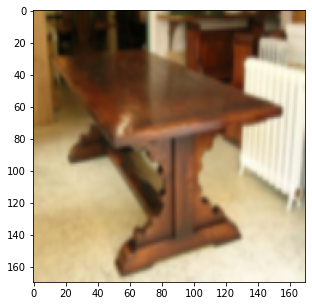

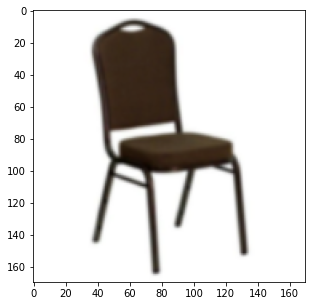

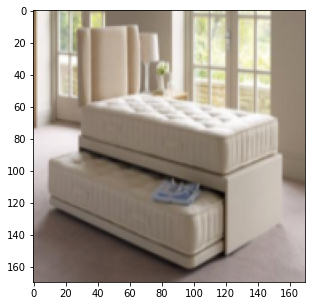

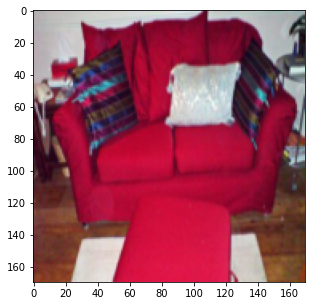

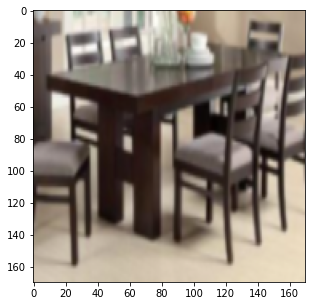

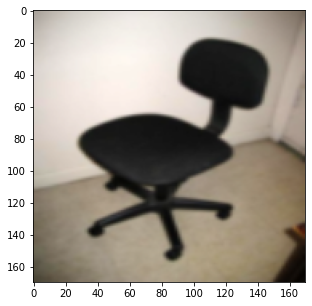

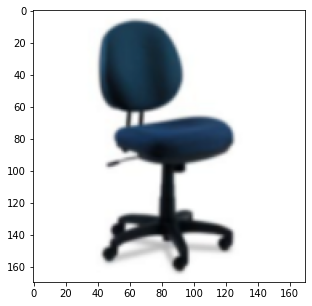

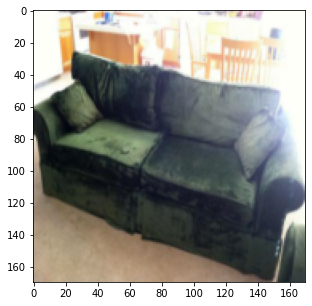

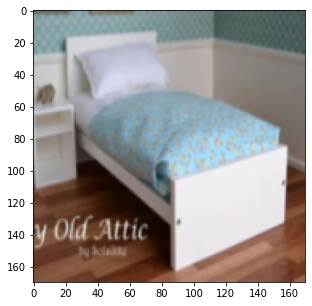

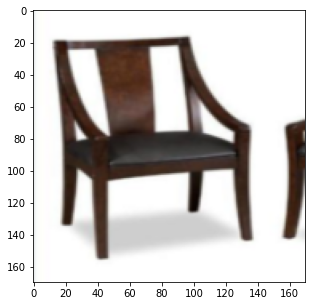

In [ ]:
if hmaps == "SALIENCY":
  for i in range(5):
    print(paths[train_labels[i]])
    plt.figure(figsize=(5,5))
    plt.imshow(train_images[i])
  print()
  for i in range(5):
    print(paths[test_labels[i]])
    plt.figure(figsize=(5,5))
    plt.imshow(test_images[i])

In [ ]:
def get_classification_model(training_images,training_labels,
                             test_images,test_labels,number_of_classes):
  """
  Args:
    image: an array of (B,170,170,3)
    labels: an array of (B,1)
  """

  tf.keras.backend.clear_session()


  base_model = vgg16.VGG16(input_shape=training_images[0].shape, 
                      weights='imagenet', 
                      include_top=False)
  
  # add a GAP layer
  output = base_model.layers[-6].output
  output = tf.keras.layers.GlobalAveragePooling2D()(output)
  output = tf.keras.layers.Dense(number_of_classes, activation='softmax')(output)

  

  # freeze the earlier layers
  for layer in base_model.layers[:-6]:
      layer.trainable=False

  # set the inputs and outputs of the model
  model = tf.keras.Model(base_model.input, output)

  # choose the optimizer
  optimizer = tf.keras.optimizers.RMSprop(0.005)

  # configure the model for training
  model.compile(loss='sparse_categorical_crossentropy', 
                optimizer=optimizer, 
                metrics=['accuracy'])
  
  # display the summary
  model.summary()
  
  return model

In [ ]:
if hmaps == "SALIENCY":
  model = get_classification_model(train_images,train_labels,
                             test_images,test_labels,len(paths))

58892288/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 170, 170, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 170, 170, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 170, 170, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 85, 85, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 85, 85, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 85, 85, 128)       147584    
______________________________________________________________

In [ ]:
if hmaps == "SALIENCY":
  model.fit(train_images,train_labels,
            epochs=10,
            validation_data=(test_images,test_labels))
  gap_weights = model.layers[-1].get_weights()[0]
  gap_weights.shape

Epoch 1/10
215/215 [==============================] - 65s 138ms/step - loss: 10.7851 - accuracy: 0.6105 - val_loss: 0.3523 - val_accuracy: 0.8759
Epoch 2/10
215/215 [==============================] - 24s 111ms/step - loss: 0.7205 - accuracy: 0.8531 - val_loss: 0.1919 - val_accuracy: 0.9380
Epoch 3/10
215/215 [==============================] - 24s 111ms/step - loss: 0.3485 - accuracy: 0.9068 - val_loss: 0.4137 - val_accuracy: 0.8725
Epoch 4/10
215/215 [==============================] - 23s 108ms/step - loss: 0.2036 - accuracy: 0.9417 - val_loss: 0.3567 - val_accuracy: 0.8855
Epoch 5/10
215/215 [==============================] - 23s 109ms/step - loss: 0.1572 - accuracy: 0.9577 - val_loss: 0.4160 - val_accuracy: 0.8945
Epoch 6/10
215/215 [==============================] - 24s 110ms/step - loss: 0.1286 - accuracy: 0.9654 - val_loss: 0.2476 - val_accuracy: 0.9295
Epoch 7/10
215/215 [==============================] - 24s 110ms/step - loss: 0.1112 - accuracy: 0.9732 - val_loss: 0.1890 - val_a

In [ ]:
def show_cam(image_value, features, results,show=True):
  '''
  Displays the class activation map of an image

  Args:
    image_value (tensor) -- preprocessed input image with size 170 x 170
    features (array) -- features of the image, shape (1, 21, 21, 512)
    results (array) -- output of the sigmoid layer
  '''

  # there is only one image in the batch so we index at `0`
  features_for_img = features[0]
  prediction = np.argmax(results[0])
  print(paths[prediction])

  # there is only one unit in the output so we get the weights connected to it
  class_activation_weights = gap_weights[:,prediction]
  #print(gap_weights.shape)(512,5)

  # upsample to the image size
  class_activation_features = sp.ndimage.zoom(features_for_img, (170/21, 170/21, 1), order=2)
  #print(class_activation_features.shape)
  
  # compute the intensity of each feature in the CAM
  cam_output  = np.dot(class_activation_features,class_activation_weights)

  if show:
    fig, axes = plt.subplots(1, 3, figsize=(15,8))
    ax = axes.ravel()

    ax[0].imshow(tf.squeeze(image_value))
    ax[0].set_title("Original")

    ax[1].imshow(tf.squeeze(image_value), vmin=0, vmax=2)
    ax[1].imshow(cam_output, alpha=.5,cmap="jet")
    ax[1].set_title("original + CAM")

    ax[2].imshow(cam_output,cmap="gray")
    ax[2].set_title("CAM")
    fig.tight_layout()
    plt.show()
  else:
    return cam_output


[<KerasTensor: shape=(None, 21, 21, 512) dtype=float32 (created by layer 'block4_conv3')>, <KerasTensor: shape=(None, 5) dtype=float32 (created by layer 'dense')>]
/content/swivelchair


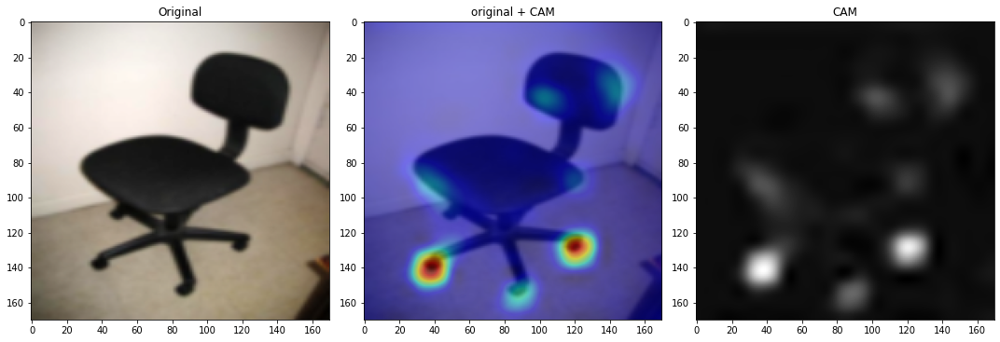

/content/swivelchair


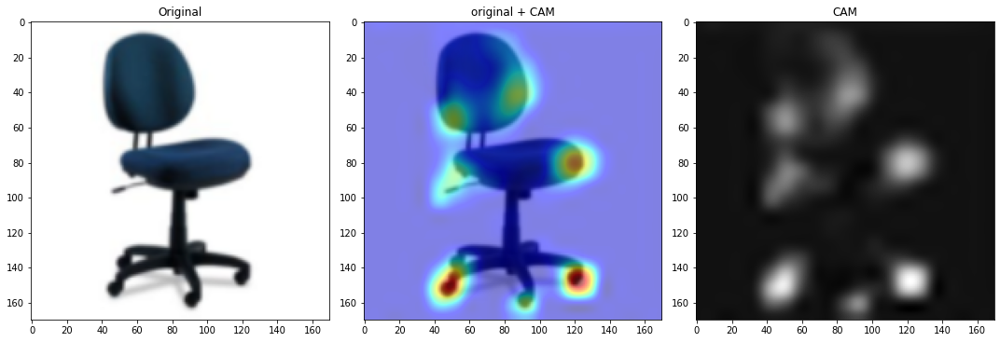

/content/sofa


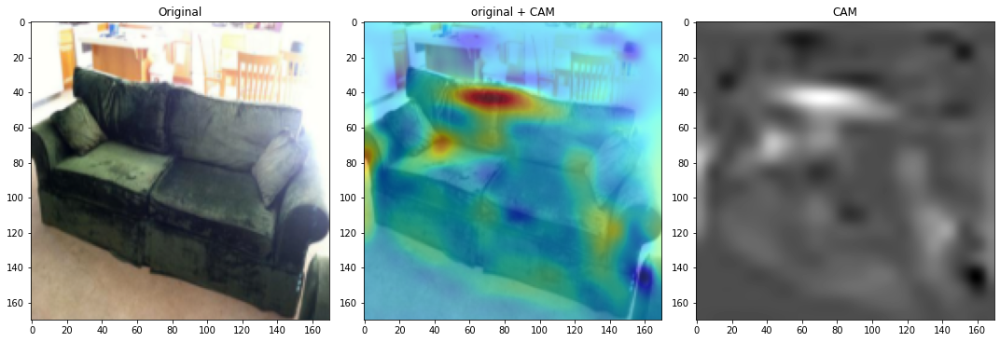

/content/sofa


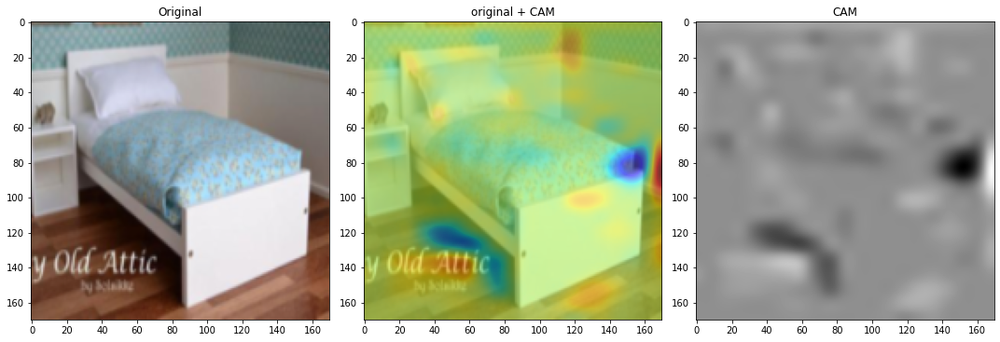

/content/chair


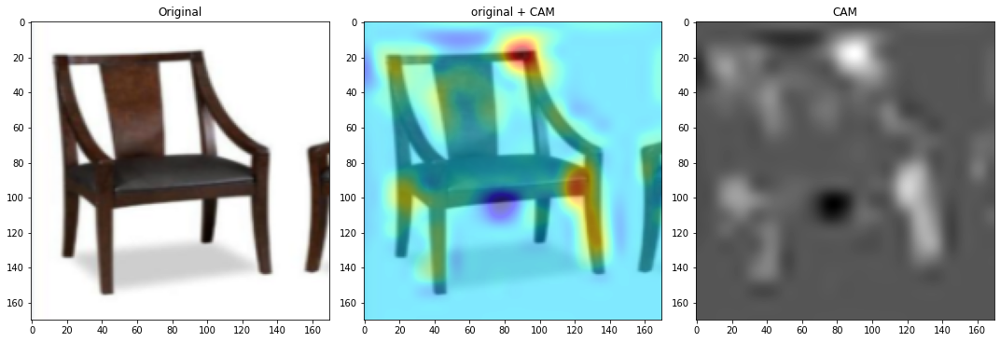

/content/sofa


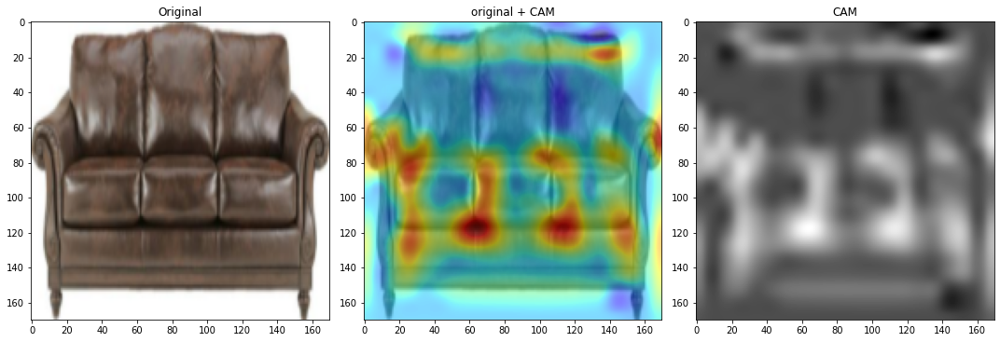

/content/chair


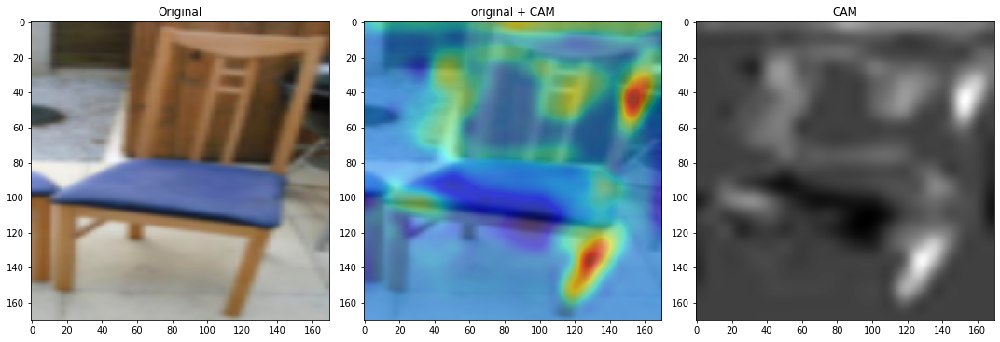

/content/chair


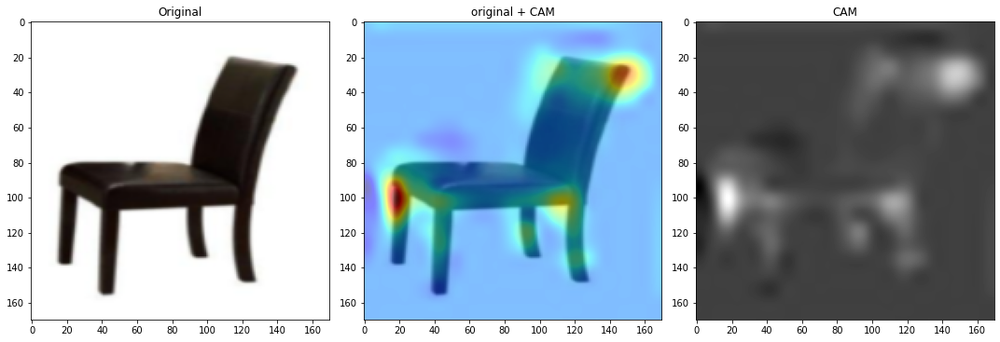

/content/bed


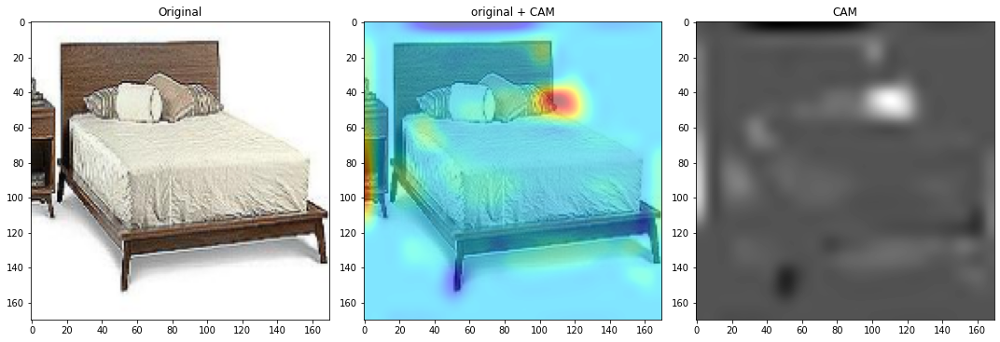

/content/chair


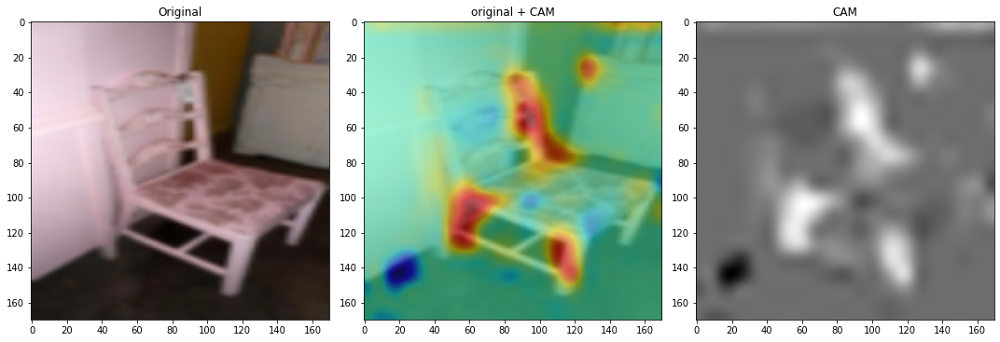

/content/bed


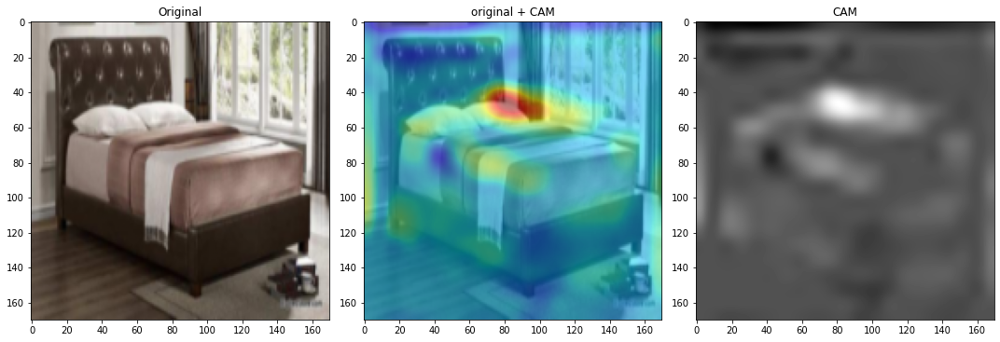

/content/sofa


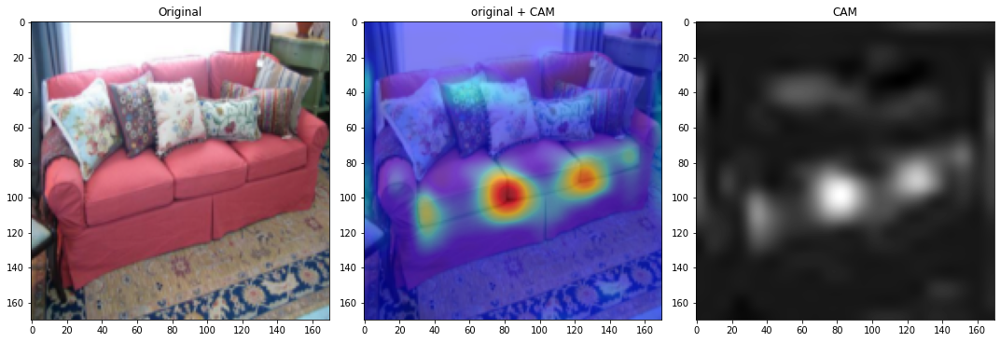

/content/chair


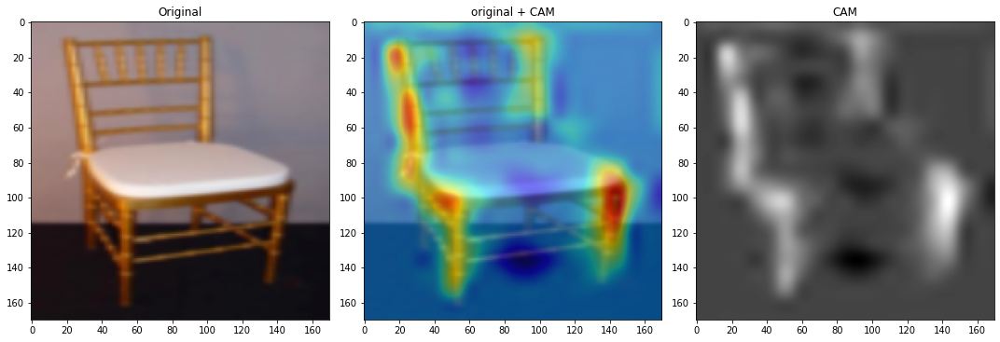

/content/sofa


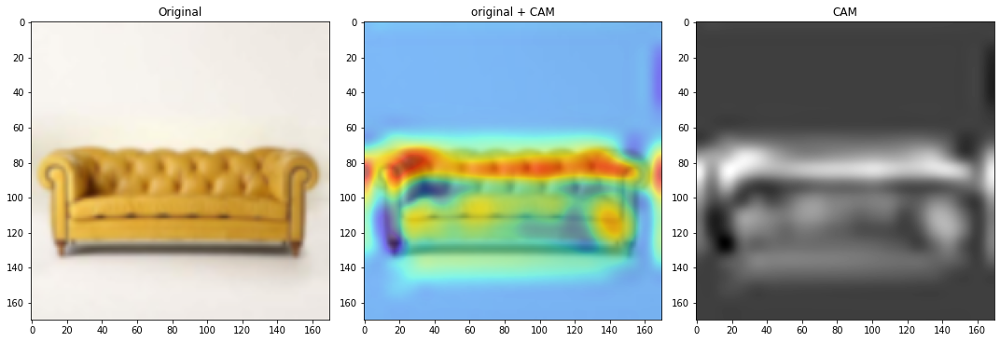

/content/chair


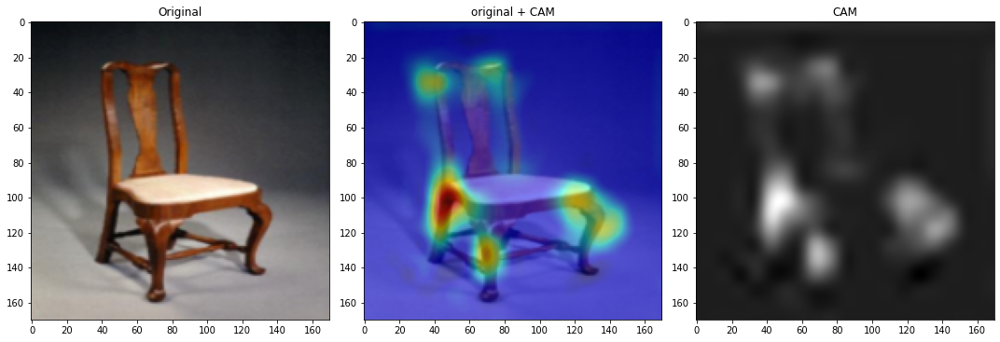

/content/swivelchair


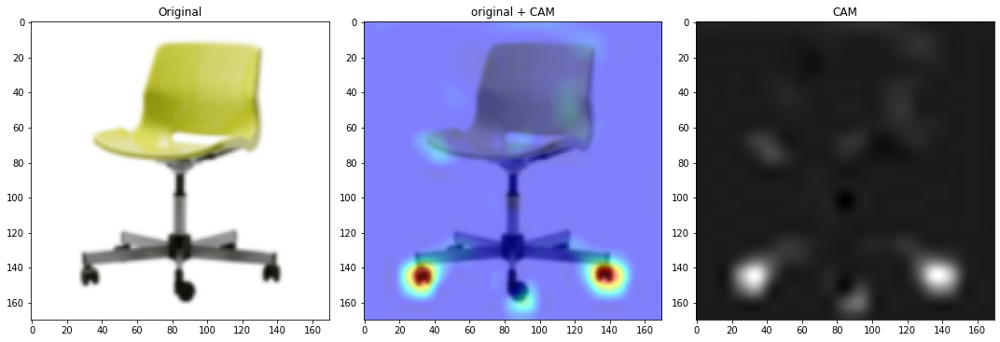

/content/swivelchair


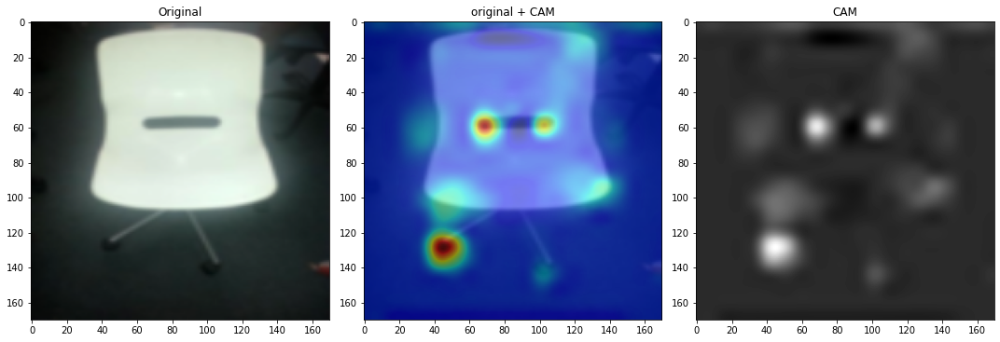

/content/chair


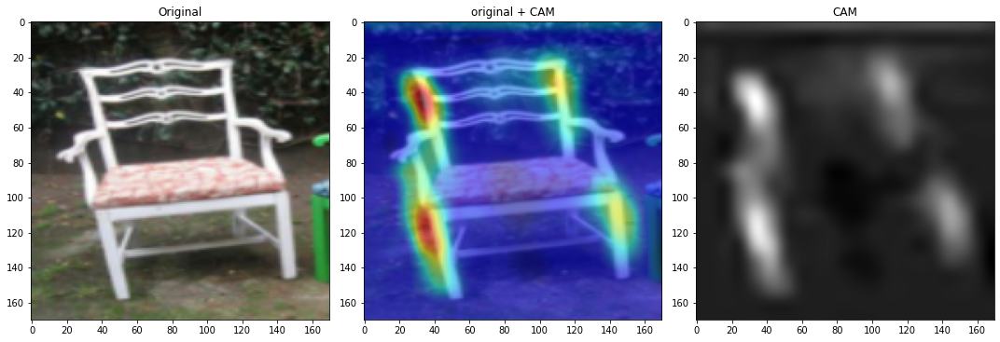

/content/chair


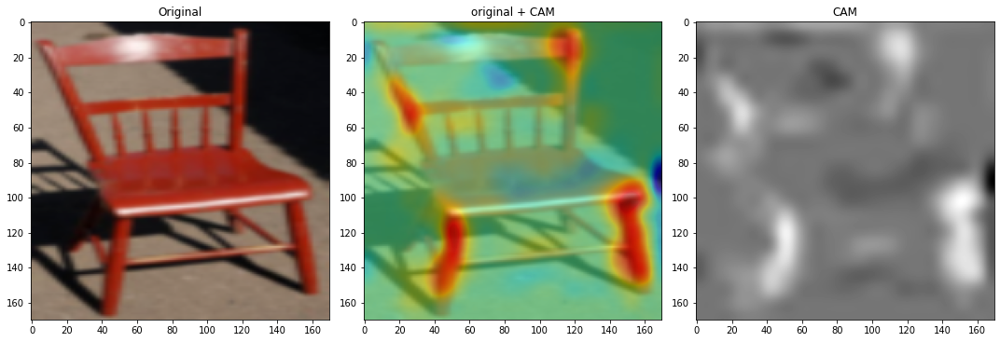

/content/bed


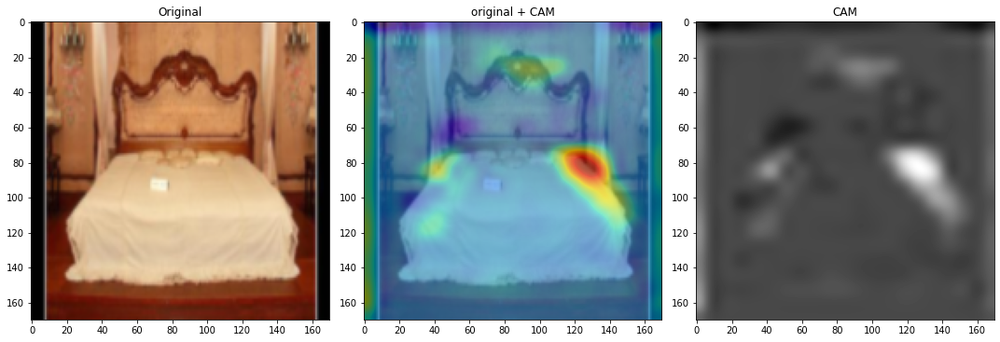

In [ ]:
if hmaps == "SALIENCY":
  cam_model  = tf.keras.Model(inputs=model.input,outputs=(model.layers[-3].output,model.layers[-1].output))
  print(cam_model.outputs)
  for i in range(20):
    tensor_image = np.expand_dims(test_images[i],axis=0)
    features,results = cam_model.predict(tensor_image)
    show_cam(tensor_image, features, results)

In [ ]:
def saliency_map(image,expected_output,model):

  
  print(paths[expected_output])

  with tf.GradientTape() as tape:
    inputs = tf.cast(image, tf.float32)

    # watch the input pixels
    tape.watch(inputs)

    predictions = model(inputs)

    # get the loss
    loss = tf.keras.losses.sparse_categorical_crossentropy(
        expected_output, predictions
    )

  # get the derivative of loss with respect to the inputs
  gradients = tape.gradient(loss, inputs)

  #RGB to grayscale
  grayscale_tensor = tf.reduce_sum(tf.abs(gradients), axis=-1)

  normalized_tensor = tf.cast(
    255* (grayscale_tensor - tf.reduce_min(grayscale_tensor))
    / (tf.reduce_max(grayscale_tensor) - tf.reduce_min(grayscale_tensor)),
    tf.uint8,
  )

  # remove the channel dimension to make the tensor a 2d tensor
  normalized_tensor = tf.squeeze(normalized_tensor)

  fig, axes = plt.subplots(1, 3, figsize=(15,8))
  ax = axes.ravel()

  ax[0].imshow(tf.squeeze(image))
  ax[0].set_title("Original")

  ax[1].imshow(tf.squeeze(image), vmin=0, vmax=2)
  ax[1].imshow(normalized_tensor, alpha=.5,cmap="jet")
  ax[1].set_title("original + Saliency")

  ax[2].imshow(normalized_tensor,cmap="gray")
  ax[2].set_title("SALIENCY")
  fig.tight_layout()
  plt.show()

/content/swivelchair


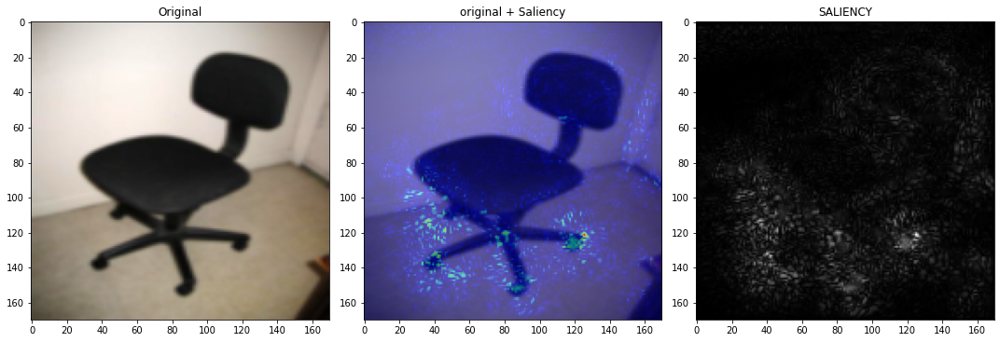

/content/swivelchair


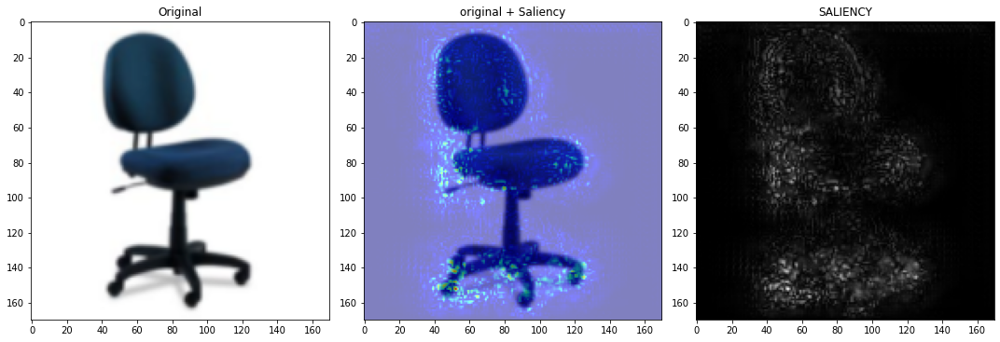

/content/sofa


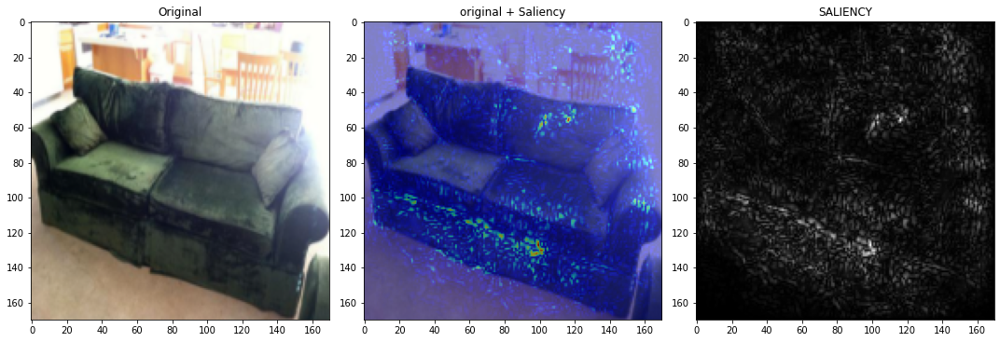

/content/bed


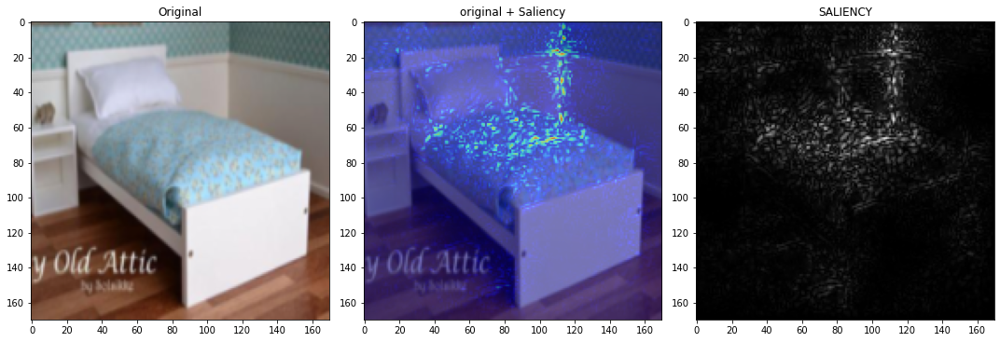

/content/chair


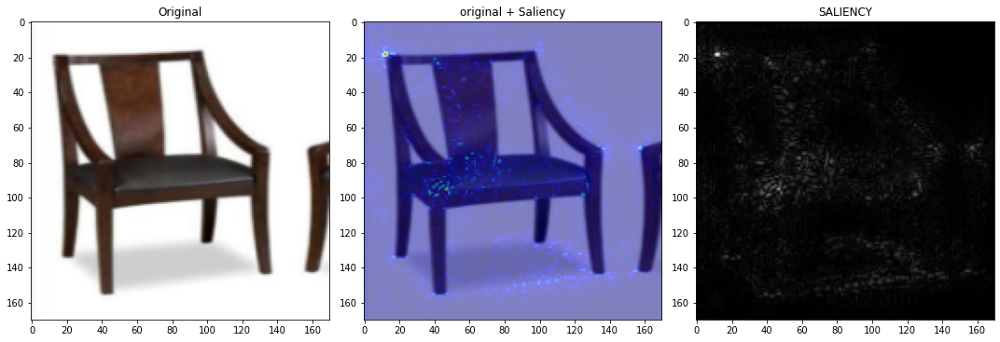

/content/sofa


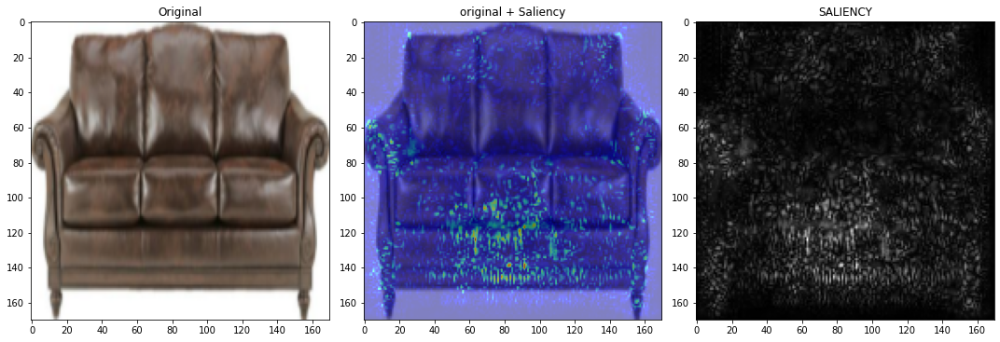

/content/chair


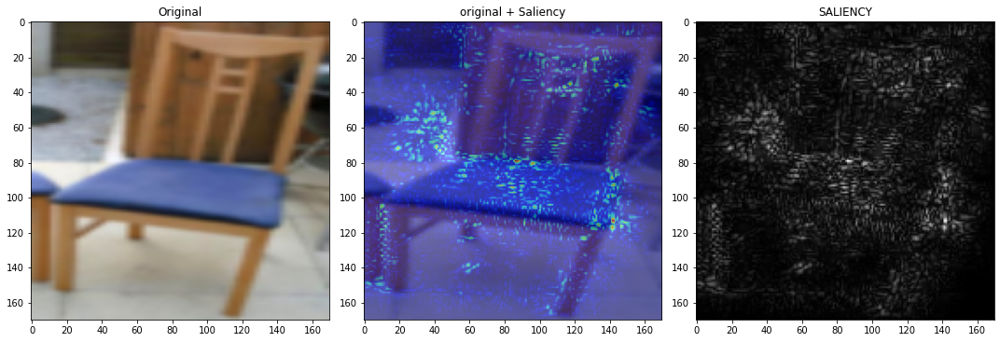

/content/chair


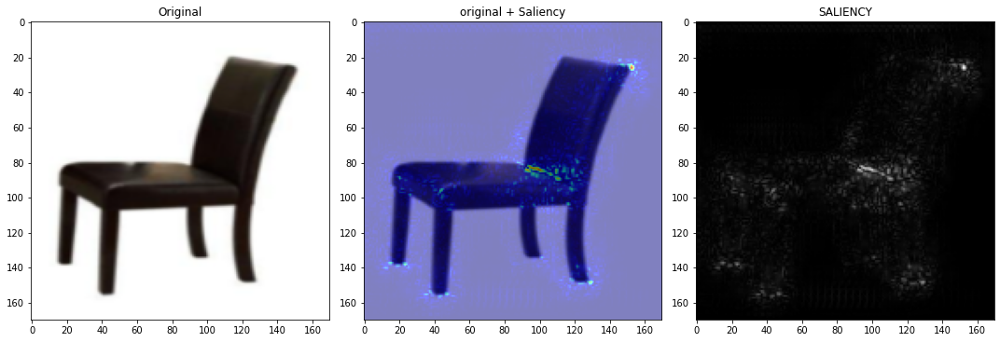

/content/bed


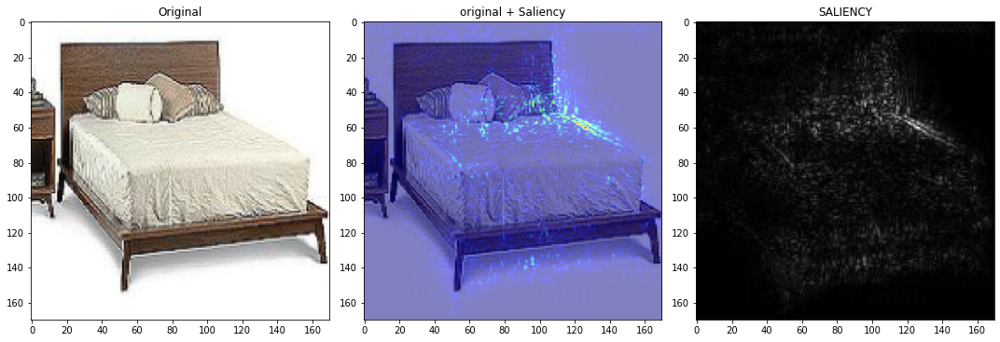

/content/chair


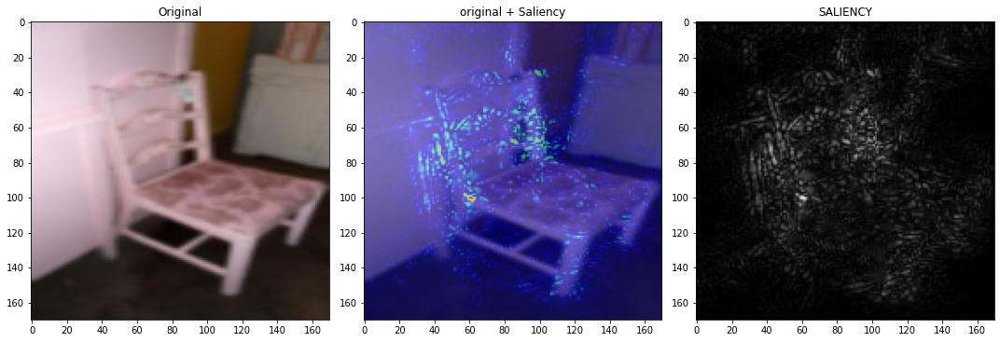

In [ ]:
if hmaps == "SALIENCY":
  for i in range(10):
    tensor_image = np.expand_dims(test_images[i],axis=0)
    features,results = cam_model.predict(tensor_image)
    saliency_map(tensor_image,test_labels[i],model)

In [ ]:
def get_GRADCAM(processed_image, actual_label, layer_name='block4_conv3',end=512):
    """
    GRADIENT WEIGHTED CAM
    """

    with tf.GradientTape() as tape:
        conv_output_values, predictions = cam_model(processed_image)

        # watch the conv_output_values
        tape.watch(conv_output_values)

        #class_index = np.argmax(actual_label[0])
        pred = predictions[0,actual_label]
      
        loss = tf.keras.losses.sparse_categorical_crossentropy(
        actual_label, predictions
    )
    print(paths[np.argmax(predictions[0])])
  
    # get the gradient of the loss with respect to the outputs of the last conv layer
    grads_values = tape.gradient(loss, conv_output_values)
    grads_values = K.mean(grads_values, axis=(0,1,2))

    conv_output_values = np.squeeze(conv_output_values.numpy())
    grads_values = grads_values.numpy()
    #print(conv_output_values.shape)
    conv_output_values = conv_output_values[:,:,:end]
    #print(conv_output_values.shape)
    # weight the convolution outputs with the computed gradients
    for i in range(conv_output_values.shape[-1]): ## Number of filters 
        conv_output_values[:,:,i] *= grads_values[i]
    

    heatmap = np.mean(conv_output_values, axis=-1)
    
    heatmap = np.maximum(heatmap, 0)
    heatmap /= heatmap.max()
    
    del conv_output_values, grads_values, loss
   
    return heatmap

/content/swivelchair


<Figure size 432x288 with 0 Axes>

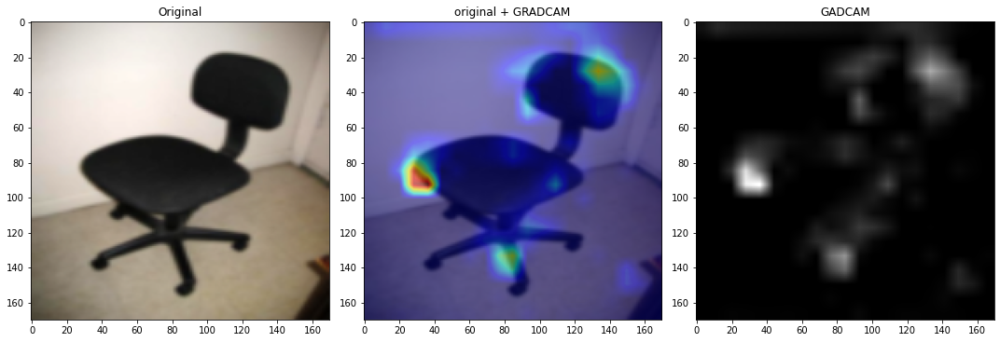

In [ ]:
if hmaps == "SALIENCY":
  ## GRAD CAMS
  for i in range(1):
    tensor_image = np.expand_dims(test_images[i],axis=0)
    features,results = cam_model.predict(tensor_image)
    plt.figure()
    CAM = get_GRADCAM(tensor_image,test_labels[i],model)
    CAM = np.expand_dims(CAM,axis=-1)
    CAM = tf.image.resize(CAM,[170,170])
    fig, axes = plt.subplots(1, 3, figsize=(15,8))
    ax = axes.ravel()

    
    ax[0].imshow(tf.squeeze(tensor_image))
    ax[0].set_title("Original")

    ax[1].imshow(tf.squeeze(tensor_image), vmin=0, vmax=2)

    ax[1].imshow(tf.squeeze(CAM,axis=-1), alpha=.5,cmap="jet")
    ax[1].set_title("original + GRADCAM")

    ax[2].imshow(tf.squeeze(CAM,axis=-1),cmap="gray")
    ax[2].set_title("GADCAM")
    fig.tight_layout()
    plt.show()

In [ ]:
def show_sample(sample_image,sample_label,end=512):
    
  outputs = [layer.output for layer in model.layers[1:14]]

  # Define a new model that generates the above output
  vis_model = tf.keras.Model(model.input, outputs)

  # store the layer names we are interested 
    
  #print("Layers that will be used for visualization: ")
  #for layer in outputs:
    #print(layer.name.split("/")[0])

  sample_image_processed = np.expand_dims(sample_image, axis=0)
  activations = vis_model.predict(sample_image_processed)
  #print(activations[0].shape)##(1,170,170,64)
  pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    
  heatmap = get_GRADCAM(sample_image_processed, sample_label,end=end)
  heatmap = cv.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
  heatmap = heatmap *255
  heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
  heatmap = cv.applyColorMap(heatmap, cv.COLORMAP_HOT)
  converted_img = sample_image
  super_imposed_image = cv.addWeighted(converted_img, 0.8, heatmap.astype('float64'), 2e-3, 0.0)

  f,ax = plt.subplots(1,3, figsize=(15,8))

  ax[0].imshow(sample_image)
  ax[0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
  ax[0].axis('off')
    
  ax[1].imshow(heatmap)
  ax[1].set_title("GRAD Class Activation Map")
  ax[1].axis('off')
    
  ax[2].imshow(super_imposed_image)
  ax[2].set_title("Activation map superimposed")
  ax[2].axis('off')
  plt.tight_layout()
  plt.show()
  del vis_model
  return activations

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


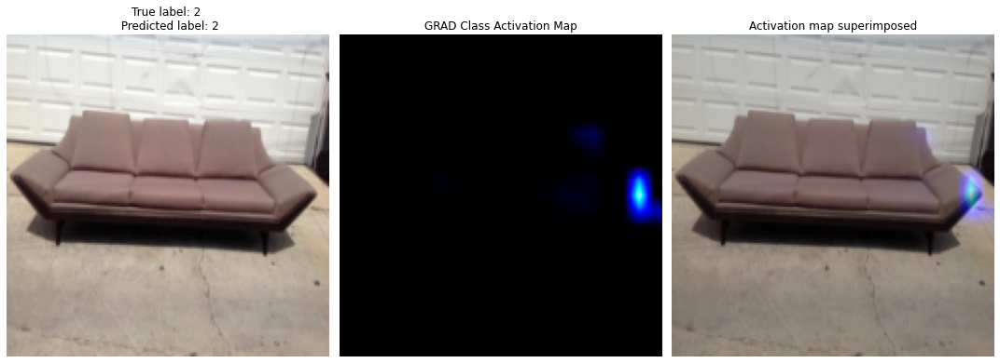

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


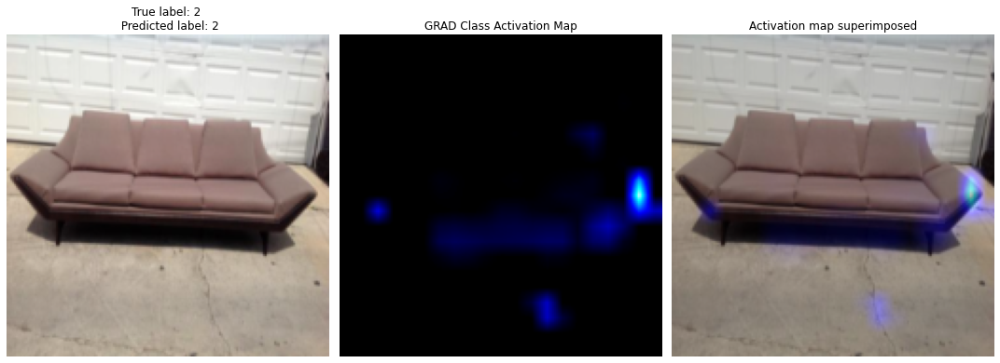

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


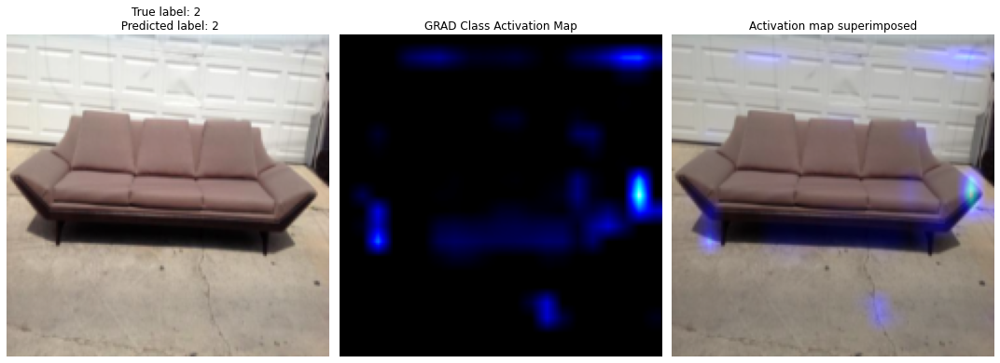

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


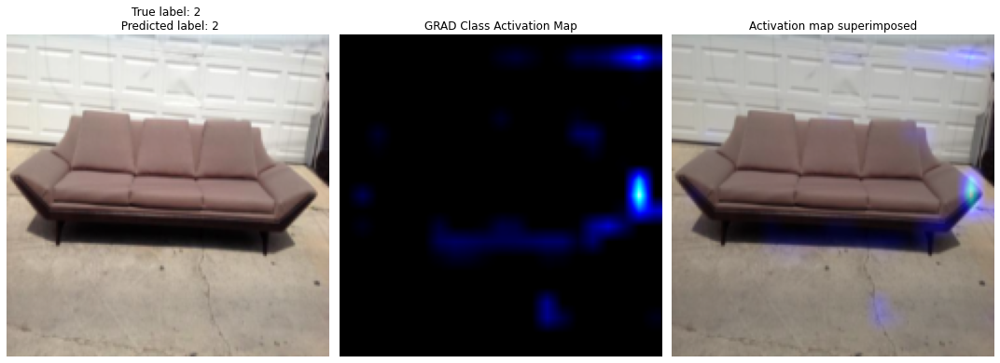

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


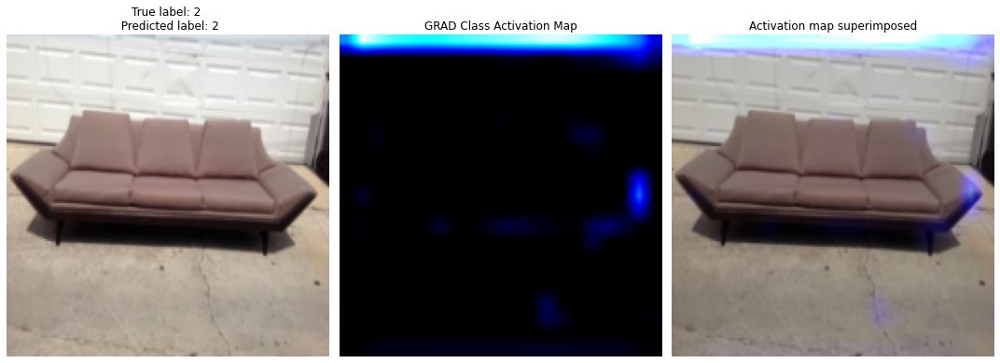

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


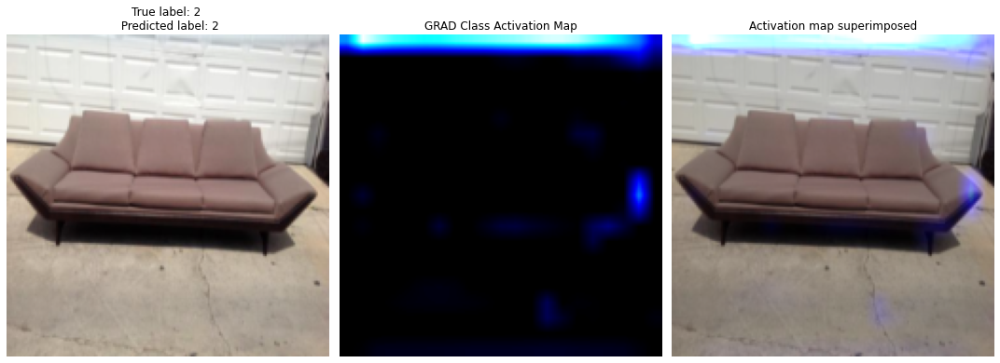

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


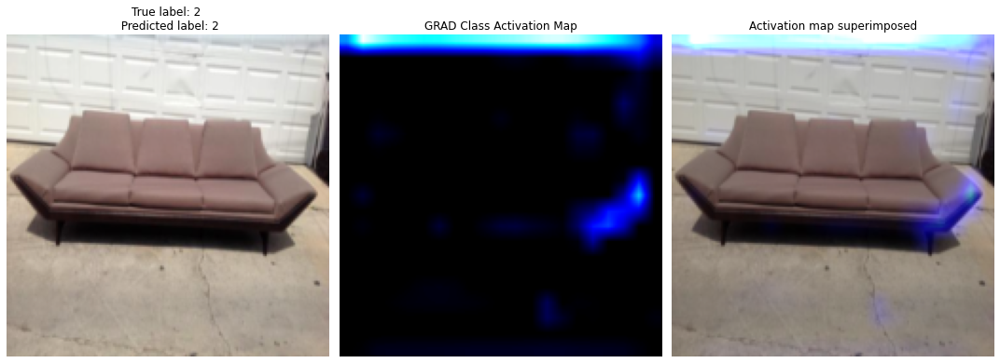

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


/content/sofa


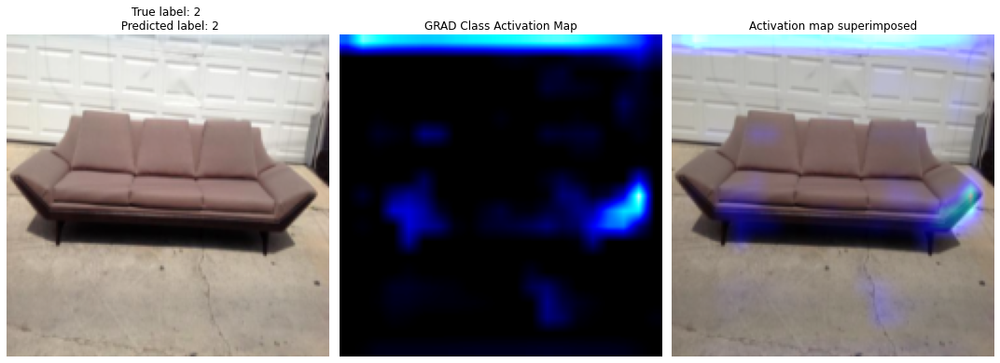

In [ ]:
if hmaps == "SALIENCY":
  for i in range(27,28):
    for k in range(64,513,64):
      _=show_sample(test_images[i],test_labels[i],end=k)

In [ ]:
if hmaps!="SALIENCY":
  print(str(X_train1.shape)+"\n"+str(X_test1.shape))

# **HeatMaps**

---



In [ ]:
def clustering_heatmap(data):
  def get_mid(x):
    i,mid,coordinates = x
    return mid
  keypoints = data.shape[-2]
  left = [] ## array with indices of midpoint less than mid width of image
  right = []## array with indices of midpoint greater than mid width of image

 
  for i in range(data.shape[0]):
    coordinates = data[i].copy()
    ### translate_coords with respect to 8,9
    xt1,_= coordinates[8]
    xt2,_ = coordinates[9]
    mid_chair = int((xt1+xt2)/2)
    translation_value = int(HEATMAP_SIZE[1]/2)-mid_chair

    coordinates[:,0] +=translation_value 
    x1,_ = coordinates[0]
    x2,_ = coordinates[1]
    coordinates[:,0] -=translation_value
    mid = int(round((x1+x2)/2))
    if mid>int(HEATMAP_SIZE[1]/2):
      right.append((i,mid,coordinates))
    else:
      left.append((i,mid,coordinates))
  
  left.sort(key=get_mid)
  right.sort(key=get_mid)

  ## left and right is distributed into four quarters
  left_distribution_heatmap = np.zeros((HEATMAP_SIZE[0],HEATMAP_SIZE[1],keypoints),dtype=np.float32)
  right_distribution_heatmap = np.zeros((HEATMAP_SIZE[0],HEATMAP_SIZE[1],keypoints),dtype=np.float32)
  for item in left:
    _,_,coordinates = item
    for i,coord in enumerate(coordinates):
      x,y = coord
      while x >= HEATMAP_SIZE[1]:
        x-=1
      while y >= HEATMAP_SIZE[0]:
        y-=1
      left_distribution_heatmap[y,x,i]+=5

  for item in right:
    _,_,coordinates = item
    for i,coord in enumerate(coordinates):
      x,y = coord
      while x >= HEATMAP_SIZE[1]:
        x-=1
      while y >= HEATMAP_SIZE[0]:
        y-=1
      left_distribution_heatmap[y,x,i]+=5

  left_distribution_heatmap = ((left_distribution_heatmap-left_distribution_heatmap.min())
                                /(left_distribution_heatmap.max()-left_distribution_heatmap.min()))*0.25
    
  
  right_distribution_heatmap = ((right_distribution_heatmap-right_distribution_heatmap.min())
                                /(right_distribution_heatmap.max()-right_distribution_heatmap.min()))*0.25


  return [left,right]

In [ ]:
#left,right = clustering_heatmap(train_labels[annotator])
#print(len(left))
#print(len(right))
#for i in range(750,799):
#  index,mid,coordinates = left[i]
#  plt.figure(figsize=(8,8))
#  plt.imshow(X_train[0][index])

In [ ]:
### back&front chairs could be solved by slopes
#for i in range(900,949):
#  index,mid,coordinates = right[i]
#  plt.figure(figsize=(8,8))
#  heatmap = np.zeros((HEATMAP_SIZE[0],HEATMAP_SIZE[1]))
  #heatmap[coordinates[0,1]-1,mid+1] = 255
#  heatmap = tf.image.resize(np.expand_dims(heatmap,axis=-1),[X_train[0][index].shape[0],X_train[0][index].shape[1]])
#  plt.imshow(X_train[0][index]+heatmap)

In [ ]:
def scoring_sum(labels,keypoints_num):
    heatmaps = list()
    for example in range(labels[0].shape[0]):
        main_heatmap = np.zeros(shape=(40,30,keypoints_num),dtype="float32")
        for label in labels:
            i=0
            for x,y in zip(label[example,:,0],label[example,:,1]):
                if x!=-1 and y!=-1 and x<=29 and y<=39:
                  main_heatmap[y,x,i]+=5
                i+=1      
        norm = (main_heatmap-main_heatmap.min())/(main_heatmap.max()-main_heatmap.min())                
        heatmaps.append(norm)
        
    return np.array(heatmaps)

In [ ]:
def normal_heatmap(data):
  keypoints = data.shape[-2]
  heatmaps = []
  for i in range(data.shape[0]):
    heatmap = np.zeros(shape=(HEATMAP_SIZE[0],HEATMAP_SIZE[1],keypoints),dtype=np.float32)
    coordinates = data[i]
    k = 0
    for x,y in coordinates:
      if x>=0 and y>=0 and x<=HEATMAP_SIZE[1] and y<=HEATMAP_SIZE[0]:
        if x == HEATMAP_SIZE[1]:
          x-=1
        if y == HEATMAP_SIZE[0]:
          y-=1
        heatmap[y,x,k] = 1
      k+=1
    heatmaps.append(heatmap)
  
  heatmaps = np.array(heatmaps)
  normalized = (heatmaps-heatmaps.min())/(heatmaps.max()-heatmaps.min())
  return heatmaps

In [ ]:
def gaussian_heatmap(data,sigma=1.0,on_point=False):

  Z = 1/(2 * np.pi * sigma ** 2)
  key_points = data.shape[-2]
  heatmaps = []  
  
  for example in data:
    midy = int(HEATMAP_SIZE[0]/2) 
    midx = int(HEATMAP_SIZE[1]/2)

    k=0
    heatmap = np.zeros((HEATMAP_SIZE[0],HEATMAP_SIZE[1],key_points),dtype=np.float32)
    for key_point in example:
      x,y = key_point
      if x == HEATMAP_SIZE[1]:
        x-=1
      if y == HEATMAP_SIZE[0]:
        y-=1
      if on_point:
        ## AS WE GO FURTHER DECREASE SCORE ## 
        midx,midy = x,y
        for row in range(HEATMAP_SIZE[0]):
          for column in range(HEATMAP_SIZE[1]):
            c = -((column-midx)**2 + (row-midy)**2)
            heatmap[row,column,k] = Z*np.exp(c/(2*sigma**2))
      else:
        ## USE CENTER OF IMAGE APPROACH ## 
        if x>=0 and y>=0 and x<=HEATMAP_SIZE[1] and y<=HEATMAP_SIZE[0]:
          c = -((x-midx)**2 + (y-midy)**2)
          heatmap[y,x,k] = Z*np.exp(c/(2*sigma**2))
      k+=1
    heatmap/=np.sum(heatmap)
    heatmaps.append(heatmap)

  heatmaps = np.array(heatmaps)
  normalized = (heatmaps-heatmaps.min())/(heatmaps.max()-heatmaps.min())
  return normalized

In [ ]:
def visualize_heatmap(images,map,index,key_point,all=False,resize=False):
  """
  Args:
    image: an array of (B,W,H,C)
    map: an array of (B,W,H,K) where key is the number of key-points
    index: an index for the image
    key_point: an index for the key_point

  """

  heatmap = None
  image = images[index]

  if all:
    ## Generating complete heatmap
    ### when generating all use non-max_suppression
    ### make sure each keypoint has constant intensity value
    complete_map = np.zeros((map.shape[1],map.shape[2]))

    for i in range(map.shape[-1]):
      minimap = map[index,:,:,i].copy()

      max_value = minimap.max()
      
      minimap[minimap<max_value]=0
      r = tf.argmax(tf.argmax(minimap,axis=1))
      c = tf.argmax(tf.argmax(minimap,axis=0))
      minimap[r,c] = 1.0
      complete_map+=minimap

    heatmap = complete_map
  else:
    heatmap = map[index,:,:,key_point]
  
  if resize:
    heatmap = np.expand_dims(heatmap,-1)
    heatmap = tf.image.resize(heatmap,[image.shape[0],image.shape[1]])
    heatmap = np.squeeze(heatmap,axis=-1)

  fig, axes = plt.subplots(1, 2, figsize=(8, 4))
  ax = axes.ravel()

  ax[0].imshow(image)
  ax[0].set_title("Original")

  ax[1].imshow(image, vmin=0, vmax=2)
  ax[1].imshow(heatmap, alpha=.7,cmap="gray")
  ax[1].set_title("Original + heatmap")

  fig.tight_layout()
  plt.show()
  plt.figure(figsize=(20,20))

In [ ]:
heatmaps = None
test_heatmaps = None
if hmaps == "GAUSSIAN":
  heatmaps = gaussian_heatmap(train_labels[annotator],sigma=1.2,on_point=True)
  test_heatmaps = gaussian_heatmap(test_labels[annotator],sigma=1.2,on_point=True)
elif hmaps == "NORMAL":
  heatmaps = normal_heatmap(train_labels[annotator])
  test_heatmaps = normal_heatmap(test_labels[annotator])
elif hmaps == "SCORE":
  heatmaps = scoring_sum(train_labels,10)
  test_heatmaps = scoring_sum(test_labels,10)
#else:
#  heatmaps = saliency_map()
 
print(heatmaps.shape)

(1748, 40, 30, 10)


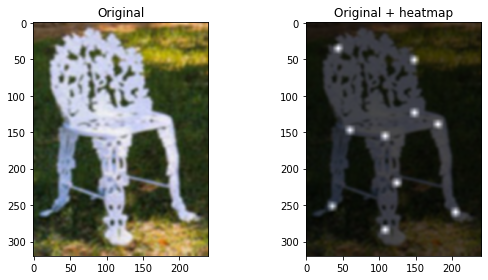

<Figure size 1440x1440 with 0 Axes>

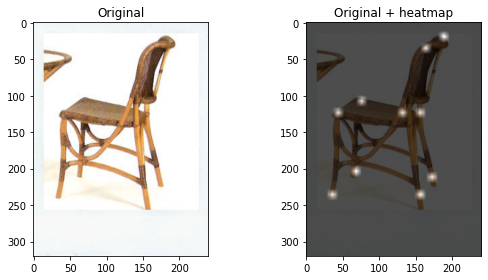

<Figure size 1440x1440 with 0 Axes>

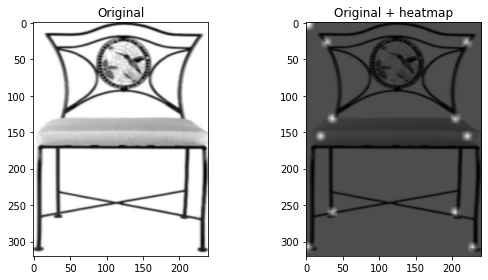

<Figure size 1440x1440 with 0 Axes>

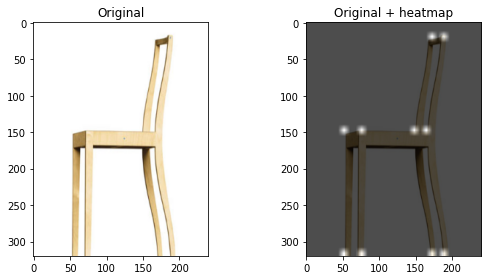

<Figure size 1440x1440 with 0 Axes>

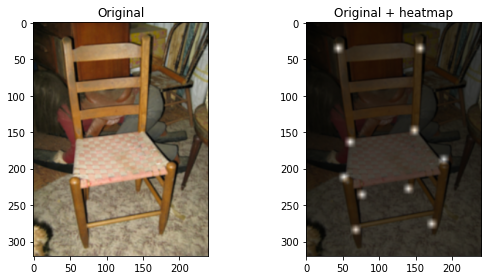

<Figure size 1440x1440 with 0 Axes>

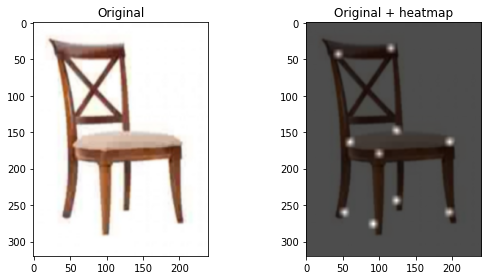

<Figure size 1440x1440 with 0 Axes>

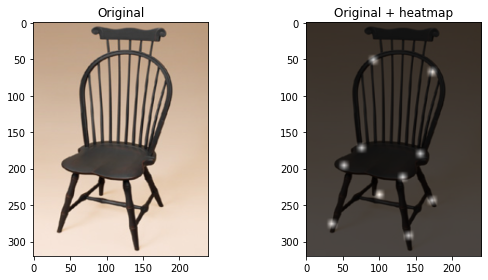

<Figure size 1440x1440 with 0 Axes>

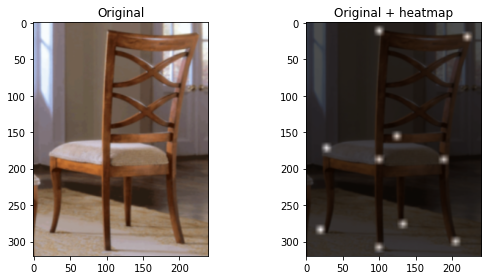

<Figure size 1440x1440 with 0 Axes>

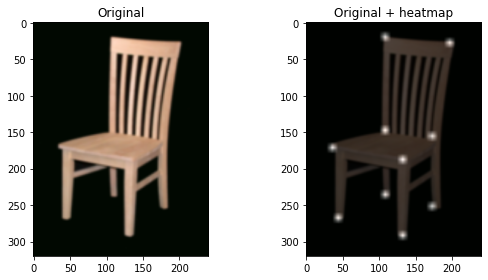

<Figure size 1440x1440 with 0 Axes>

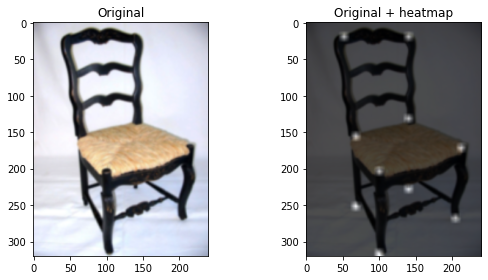

<Figure size 1440x1440 with 0 Axes>

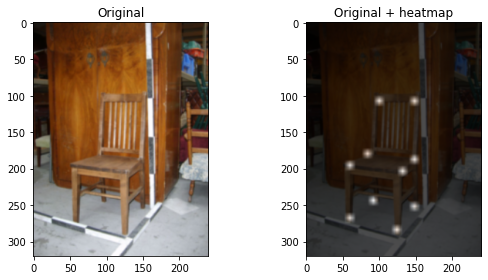

<Figure size 1440x1440 with 0 Axes>

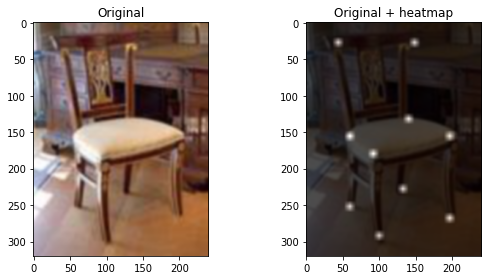

<Figure size 1440x1440 with 0 Axes>

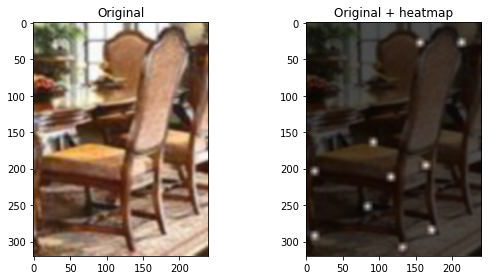

<Figure size 1440x1440 with 0 Axes>

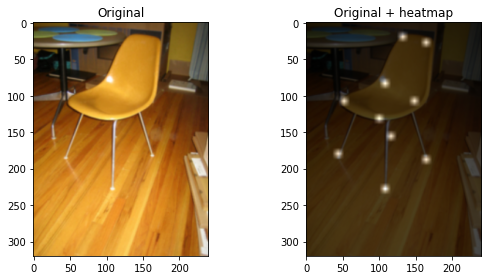

<Figure size 1440x1440 with 0 Axes>

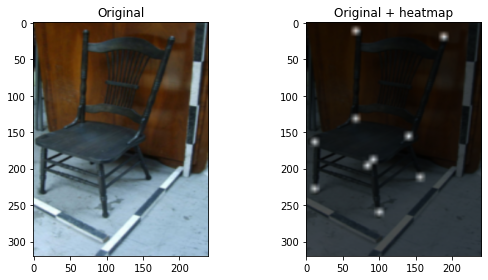

<Figure size 1440x1440 with 0 Axes>

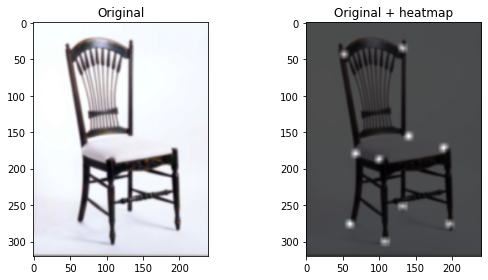

<Figure size 1440x1440 with 0 Axes>

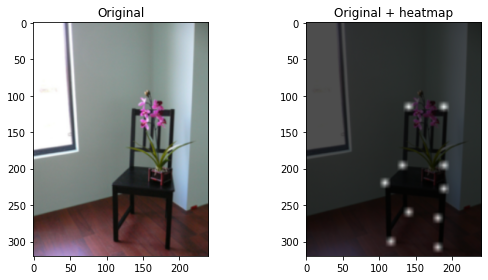

<Figure size 1440x1440 with 0 Axes>

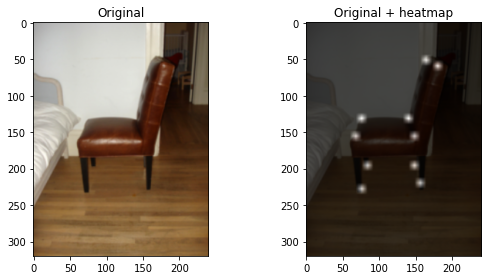

<Figure size 1440x1440 with 0 Axes>

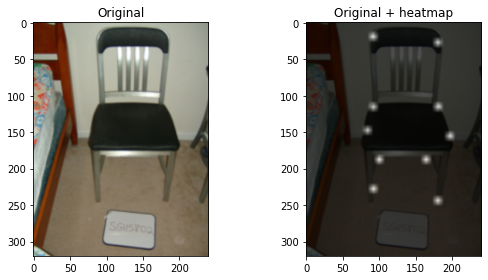

<Figure size 1440x1440 with 0 Axes>

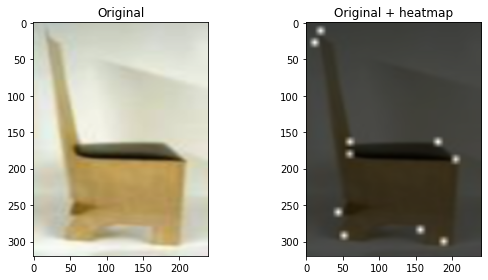

<Figure size 1440x1440 with 0 Axes>

In [ ]:
for i in range(20):
  visualize_heatmap(X_train[0],heatmaps,i,1,all=True,resize=True)

# **Model Building & Training**

---



In [ ]:
from tensorflow.keras.layers import Conv2D,MaxPooling2D,BatchNormalization,Input,UpSampling2D,concatenate,Flatten,Dense,Activation
from tensorflow.keras.utils import plot_model

In [ ]:
class ConvMax(tf.keras.Model):
  
  def __init__(self,filters,kernel_size,scale=None,last = False):
    super(ConvMax, self).__init__()
    self.conv = Conv2D(filters,kernel_size=kernel_size,activation='relu',padding="same")
    self.bn = BatchNormalization(center=True,scale=True,trainable=True)
    self.pool = MaxPooling2D(pool_size=(2, 2))
    self.last = last
    self.scale = scale

    if self.last:
     self.conv2 = Conv2D(512,kernel_size = (9,9),activation="relu",padding="same") ### replace hard coded later
     self.bn2 = BatchNormalization(center=True,scale=True,trainable=True)

  
  def call(self,input_tensor):
    x = self.conv(input_tensor)
    x = self.bn(x)
    x = self.pool(x)

    if self.last:
      x = self.conv2(x)
      x = self.bn2(x)

    if self.scale is not None:
      x = tf.image.resize(x, [40,30]) ## replace hard coded scale later


    return x

In [ ]:
class ScaleBlock(tf.keras.Model):
    def __init__(self, filters, kernel_size,scale):
        super(ScaleBlock, self).__init__()

        self.convmax1 = ConvMax(filters[0],kernel_size)
        self.convmax2 = ConvMax(filters[1],kernel_size)
        self.convmax3 = ConvMax(filters[2],kernel_size,last=True,scale=scale)
    
    def call(self, input_tensor):
      x = self.convmax1(input_tensor)
      x = self.convmax2(x)
      x = self.convmax3(x)

      return x

In [ ]:
class Model(tf.keras.Model):

  def __init__(self,filters,kernel_size,keypoints,regression_filter=512):

    super(Model, self).__init__()
    self.scaleb1 = ScaleBlock(filters,kernel_size,scale=False)
    self.scaleb2 = ScaleBlock(filters,kernel_size,scale=True)
    self.scaleb3 = ScaleBlock(filters,kernel_size,scale=True)

    self.bn1 = BatchNormalization(center=True,scale=True,trainable=True)

    self.conv1 = Conv2D(regression_filter,kernel_size=(1,1),padding="same",activation = "relu")
    self.bn2 = BatchNormalization(center=True,scale=True,trainable=True)

    self.conv2 = Conv2D(regression_filter,kernel_size=(1,1),padding="same",activation="relu")
    self.bn3 = BatchNormalization(center=True,scale=True,trainable=True)

    self.conv_key = Conv2D(keypoints,kernel_size=(1,1),padding="same",activation="sigmoid")
    

  def call(self,input_tensor):
    x1 = self.scaleb1(input_tensor[0])
    x2 = self.scaleb2(input_tensor[1])
    x3 = self.scaleb3(input_tensor[2])

    X = tf.keras.layers.add([x1,x2,x3])
    X = self.bn1(X)

    X = self.conv1(X)
    X = self.bn2(X)

    X = self.conv2(X)
    X = self.bn3(X)

    X = self.conv_key(X)

    return X

In [ ]:
### to be changed later by low level code ###
model = Model([64,128,256],(5,5),10,regression_filter=512)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='binary_crossentropy')

In [ ]:
class Stopper(tf.keras.callbacks.Callback):
  def __init__(self,training_loss,validation_loss):
    self.training_loss = training_loss
    self.validation_loss = validation_loss
    super(Stopper,self).__init__()

  def on_epoch_end(self,epoch,logs={}):
    if logs["loss"]<=self.training_loss or logs["val_loss"]<=self.validation_loss:
      self.model.stop_training = True

def percentage_of_correct_keypoints(y_true,y_pred):#### custom metrics
  pass

In [ ]:
#stopper = Stopper(0.0014,0.0000)
history = model.fit(X_train,heatmaps,epochs=35,verbose=True, batch_size=16,
                    #callbacks=[stopper],
                    validation_data=(X_test, test_heatmaps))

# **Model Evaluation & Inspecting Results**

---



In [ ]:
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.savefig(hmaps+".pdf")
plt.show()

In [ ]:
key_points_error = []

for i in range(heatmaps.shape[-1]):
  key_points_error.append(0)

key_points_error = np.array(key_points_error)


for i in range(X_test[0].shape[0]):
  prediction = model.predict([np.expand_dims(X_test[0][i],axis=0),
                              np.expand_dims(X_test[1][i],axis=0),
                              np.expand_dims(X_test[2][i],axis=0)])
  
  t_map = test_heatmaps[i,:,:]
  for k in range(prediction.shape[-1]):
    pred_map = prediction[0,:,:,k].copy()
    truth_map = t_map[:,:,k].copy()

    r_pred,c_pred = np.unravel_index(pred_map.argmax(),pred_map.shape)
    r_true,c_true = np.unravel_index(truth_map.argmax(),truth_map.shape)
    
    dy = tf.abs(r_true-r_pred)
    dx = tf.abs(c_true-c_pred)
    error = dx+dy
    key_points_error[k]+=error

In [ ]:
%matplotlib inline
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
key_point_index = [i for i in range(heatmaps.shape[-1])]
#print(key_points_error)
ax.bar(key_point_index,key_points_error/X_test[0].shape[0])

plt.savefig(hmaps+"AE.jpg",bbox_inches='tight',dpi=150)
plt.show()

In [ ]:
key_points_error = []
for k in range(10):
  thresh=[]
  for i in range(heatmaps.shape[-1]):
    thresh.append(0)
  key_points_error.append(thresh)

key_points_error = np.array(key_points_error)


for i in range(X_test[0].shape[0]):
  prediction = model.predict([np.expand_dims(X_test[0][i],axis=0),
                              np.expand_dims(X_test[1][i],axis=0),
                              np.expand_dims(X_test[2][i],axis=0)])
  
  t_map = test_heatmaps[i,:,:]
  for k in range(prediction.shape[-1]):
    pred_map = prediction[0,:,:,k].copy()
    truth_map = t_map[:,:,k].copy()

    r_pred,c_pred = np.unravel_index(pred_map.argmax(),pred_map.shape)
    r_true,c_true = np.unravel_index(truth_map.argmax(),truth_map.shape)
    
    dy = tf.abs(r_true-r_pred)
    dx = tf.abs(c_true-c_pred)
    error = dx+dy

    for thresh in range(10):
      if error<=thresh+1:
        key_points_error[thresh][k]+=1
key_points_error = np.array(key_points_error)

In [ ]:
plt.plot([i+1 for i in range(10)],(key_points_error[:,5]/X_test[0].shape[0]))
plt.xlabel("threshold")
plt.ylabel("PCK")
plt.savefig(hmaps+"PCK.jpg",bbox_inches='tight',dpi=600)
plt.show()
#plt.plot([i+1 for i in range(10)],(key_points_error[:,1]/X_test[0].shape[0]))
#plt.plot([i+1 for i in range(10)],(key_points_error[:,2]/X_test[0].shape[0]))

In [ ]:
start = 30
end = start+64
prediction = model.predict([X_test[0][start:end],X_test[1][start:end],X_test[2][start:end]])
print(prediction.shape)
print(X_test[0][start:end].shape)

(64, 40, 30, 10)
(64, 320, 240, 3)


In [ ]:
for i in range(20):
  visualize_heatmap(X_test[0][start:end],prediction,i,-1,all=True,resize=True)

# **Building Reconstruction Model**

---



In [ ]:
X_train = heatmaps
print(X_train.shape)
Y_train = Y_points_train[1].copy().astype(np.float32)
Y_test = Y_points_test[1].copy().astype(np.float32)
### translate points to center then normalize

xt1 = Y_train[:,8,0]
xt2 = Y_train[:,9,0]
mid_chair = (xt1+xt2)/2
mid_chair = mid_chair.astype("int32")
translation_value = np.expand_dims(int(HEATMAP_SIZE[1]/2)-mid_chair,axis=-1)


Y_train[:,:,0] +=translation_value 

Y_train[:,:,0]/=15
Y_train[:,:,0]-=1

Y_train[:,:,1]/=20
Y_train[:,:,1]-=1


xt1 = Y_test[:,8,0]
xt2 = Y_test[:,9,0]
mid_chair = (xt1+xt2)/2
mid_chair = mid_chair.astype("int32")
translation_value = np.expand_dims(int(HEATMAP_SIZE[1]/2)-mid_chair,axis=-1)

Y_test[:,:,0]/=15
Y_test[:,:,0]-=1

Y_test[:,:,1]/=20
Y_test[:,:,1]-=1

print("minimum in normalized X train is {}".format(Y_train[:,:,0].min()))
print("maximum in normalized X train is {}".format(Y_train[:,:,0].max()))

print("minimum in normalized Y train is {}".format(Y_train[:,:,1].min()))
print("maximum in normalized Y train is {}".format(Y_train[:,:,1].max()))

print("minimum in normalized X test is {}".format(Y_test[:,:,0].min()))
print("maximum in normalized X test is {}".format(Y_test[:,:,0].max()))

print("minimum in normalized Y test is {}".format(Y_test[:,:,1].min()))
print("maximum in normalized Y test is {}".format(Y_test[:,:,1].max()))

Y_train = Y_train.reshape(-1,20)
Y_test = Y_test.reshape(-1,20)
print(Y_train.shape)
print(Y_test.shape)

In [ ]:
def inspect(weights,rotations,translations,focus,to_rad=True):
  def rotate(theta,axis):
    rad = theta
    if to_rad:
      rad = (theta/180)*math.pi

    rotation = {}
    rotation[0] = [[1,0,0,0],
                  [0,math.cos(rad),-math.sin(rad),0],
                  [0,math.sin(rad),math.cos(rad),0],
                  [0,0,0,1]]

    rotation[1] = [[math.cos(rad),0,math.sin(rad),0],
                  [0,1,0,0],
                  [-math.sin(rad),0,math.cos(rad),0],
                  [0,0,0,1]]

    rotation[2] = [[math.cos(rad),-math.sin(rad),0,0],
                  [math.sin(rad),math.cos(rad),0,0],
                  [0,0,1,0],
                  [0,0,0,1]]

    return np.array(rotation[axis],dtype=np.float32)
  
  mean_shape = np.array([[-1,-2,1],
                        [1,-2,1],
                        [1,-2,-1],
                        [-1,-2,-1],
                        [-1,0,1],
                        [1,0,1],
                        [1,0,-1],
                        [-1,0,-1],
                        [-1,2,-1],
                        [1,2,-1]],dtype=np.float32)
  
  edges = [[1,5],[2,6],[3,7],[4,8],[5,6],[6,7],[7,8],[5,8],[8,9],[7,10],[9,10]]

  line_thickness = 1
  image  = np.full((40,30,3),255,dtype=np.float32)## creation of white image

  w0,w1,w2,w3 = weights
  rx,ry,rz = rotations
  tx,ty,tz = translations

  w0 = np.array([[0,-1,0],[0,-1,0],[0,-1.,0],[0,-1,0],
                 [0,0,0],[0,0,0],[0,0,0],[0,0,0], [0,0,0],[0,0,0]])*w0

  w1 = np.array([[0,0,0],[0,0,0],[0,0,0],[0,0,0],
                 [0,0,0],[0,0,0],[0,0.,0],[0,0,0],[0,1,0],[0,1,0]])*w1

  w2 = np.array([[-1.,0,0],[1.,0,0],[1,0,0],[-1,0,0],
                 [-1,0,0],[1,0,0],[1,0,0],[-1,0,0],[-1,0,0],[1,0,0]])*w2

  w3 = np.array([[-1.,0,1],[1,0,1],[1,0,-1],[-1.,0,-1],
                 [0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0]])*w3

  mean_shape = mean_shape+w0+w1+w2+w3
  
  points = mean_shape.T
  ones = np.expand_dims(np.ones(points.shape[-1]),axis=0)
  points = np.concatenate([points,ones],axis=0)

  Rx = rotate(rx,axis=0) ## X-axis
  Ry = rotate(ry,axis=1) ## Y-axis
  Rz = rotate(rz,axis=2) ## Z-axis
  Rxy = np.dot(Rx,Ry)## 

  R = np.dot(Rxy,Rz)### rotation matrix

  points = np.dot(R,points) ## Rx+T

  points[0]+=tx
  points[1]+=ty
  points[2]+=tz

  points = points/((1/focus)*points[2]+1)

  points[0,:]+=1
  points[0,:]*=15
  points[1,:]+=1
  points[1,:]*=20
  points = points.T

  for edge in edges:
      p1 = points[edge[0]-1]
      p2 = points[edge[1]-1]
      
      cv.line(image, (round(p1[0]), round(p1[1])), (round(p2[0]), round(p2[1])), (0, 0, 0), thickness=line_thickness)

  plt.imshow(image,cmap="gray")
  return points.astype("int32")

In [ ]:
inspect([1,1,0,0],[20,60,0],[0,0,-10],1.5)
#inspect([1,0,0,0],[20,60,0],[0,0,-10],1.5)

In [ ]:
def projection_error(y_true,y_pred):
  
  mean_shape = np.array([[-1,-2,1],
                        [1,-2,1],
                        [1,-2,-1],
                        [-1,-2,-1],
                        [-1,0,1],
                        [1,0,1],
                        [1,0,-1],
                        [-1,0,-1],
                        [-1,2,-1],
                        [1,2,-1]],dtype=np.float32)
  

  #y_true = tf.squeeze(y_true,axis=0)
  #y_pred = tf.squeeze(y_pred,axis=0)
  data = y_pred
  loss=0
  for i in range(data.shape[0]):
    y_pred=data[i]
  
    weights,R,focus = y_pred[0:4],y_pred[4:13],y_pred[13]
    w0,w1,w2,w3 = weights[0],weights[1],weights[2],weights[3]
    R = tf.reshape(R,[3,3])

    w0 = tf.constant([[0,-1,0],[0,-1,0],[0,-1.,0],[0,-1,0],
                 [0,0,0],[0,0,0],[0,0,0],[0,0,0], [0,0,0],[0,0,0]])*w0

    w1 = tf.constant([[0,0,0],[0,0,0],[0,0,0],[0,0,0],
                 [0,0,0],[0,0,0],[0,0.,0],[0,0,0],[0,1,0],[0,1,0]])*w1

    w2 = tf.constant([[-1.,0,0],[1.,0,0],[1,0,0],[-1,0,0],
                 [-1,0,0],[1,0,0],[1,0,0],[-1,0,0],[-1,0,0],[1,0,0]])*w2

    w3 = tf.constant([[-1.,0,1],[1,0,1],[1,0,-1],[-1.,0,-1],
                 [0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0]])*w3

    weighted_shape = mean_shape+w0+w1+w2+w3
  
    points = tf.transpose(weighted_shape)

    points = tf.matmul(R,points)
   
    points = points/((1/focus)*points[2]+1)##projection]

    points = points[0:2]
    points = tf.transpose(points)

    points = tf.reshape(points,[20])

    loss += tf.losses.mean_squared_error(y_true[i],points)
  return loss/data.shape[0]

In [ ]:
#projection_error(X_train[0],np.array([[0,0,0,0,0.34,1.032,0,0,0,-10,2]],np.float32))

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(44)
#9 13 20 23 28 38 43 44
def construction_model(input=Input(shape=(20))):

  ### seed 3 -1 2 5 9 14 15 16 30 33 34
  #initializer = tf.keras.initializers.GlorotUniform(seed=0)
  #initializer = tf.keras.initializers.truncated_normal(seed=0)
  #initializer = tf.keras.initializers.VarianceScaling(
  #scale=0.1, mode='fan_in', distribution='uniform')
      
  x = Flatten()(input)
  x = Dense(2048,activation="relu")(x)
  x = Dense(512,activation="relu")(x)
  x = Dense(128)(x)
  x = Dense(14)(x)

  return tf.keras.Model(inputs=input,outputs=x)

In [ ]:
model = construction_model()
plot_model(model)
model.summary()

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer = optimizer,loss=projection_error,run_eagerly=True)

In [ ]:
model.fit(Y_train,
          Y_train,
          epochs=29, verbose=True, batch_size=14)

In [ ]:
def inspect(weights,rotation,focus):
  
  mean_shape = np.array([[-1,-2,1],
                        [1,-2,1],
                        [1,-2,-1],
                        [-1,-2,-1],
                        [-1,0,1],
                        [1,0,1],
                        [1,0,-1],
                        [-1,0,-1],
                        [-1,2,-1],
                        [1,2,-1]],dtype=np.float32)
  
  edges = [[1,5],[2,6],[3,7],[4,8],[5,6],[6,7],[7,8],[5,8],[8,9],[7,10],[9,10]]

  line_thickness = 1
  image  = np.full((40,30,3),255,dtype=np.float32)## creation of white image

  w0,w1,w2,w3 = weights

  w0 = np.array([[0,-1,0],[0,-1,0],[0,-1.,0],[0,-1,0],
                 [0,0,0],[0,0,0],[0,0,0],[0,0,0], [0,0,0],[0,0,0]])*w0

  w1 = np.array([[0,0,0],[0,0,0],[0,0,0],[0,0,0],
                 [0,0,0],[0,0,0],[0,0.,0],[0,0,0],[0,1,0],[0,1,0]])*w1

  w2 = np.array([[-1.,0,0],[1.,0,0],[1,0,0],[-1,0,0],
                 [-1,0,0],[1,0,0],[1,0,0],[-1,0,0],[-1,0,0],[1,0,0]])*w2

  w3 = np.array([[-1.,0,1],[1,0,1],[1,0,-1],[-1.,0,-1],
                 [0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0]])*w3

  mean_shape = mean_shape+w0+w1+w2+w3
  
  points = mean_shape.T

  R = rotation.reshape((3,3))
  points = np.dot(R,points) ## Rx+T


  points = points/((1/focus)*points[2]+1)

  points[0,:]+=1
  points[0,:]*=15
  points[1,:]+=1
  points[1,:]*=20
  points = points.T

  for edge in edges:
      p1 = points[edge[0]-1]
      p2 = points[edge[1]-1]
      
      cv.line(image, (round(p1[0]), round(p1[1])), (round(p2[0]), round(p2[1])), (0, 0, 0), thickness=line_thickness)

  plt.imshow(image,cmap="gray")
  return points.astype("int32")

In [ ]:
model.evaluate(Y_test, Y_test, verbose=2)

In [ ]:
start=14
end = start+14
prediction = model.predict(Y_test[start:end])
print(prediction.shape)

In [ ]:
i=5
inspect(prediction[i][0:4],prediction[i][4:13],prediction[i][13])
plt.figure()
plt.imshow(X_test2[start+i])

In [ ]:
  def rotate(theta,axis):
    rad = theta
    rotation = {}
    rotation[0] = [[1,0,0,0],
                  [0,math.cos(rad),-math.sin(rad),0],
                  [0,math.sin(rad),math.cos(rad),0],
                  [0,0,0,1]]

    rotation[1] = [[math.cos(rad),0,math.sin(rad),0],
                  [0,1,0,0],
                  [-math.sin(rad),0,math.cos(rad),0],
                  [0,0,0,1]]

    rotation[2] = [[math.cos(rad),-math.sin(rad),0,0],
                  [math.sin(rad),math.cos(rad),0,0],
                  [0,0,1,0],
                  [0,0,0,1]]

    return np.array(rotation[axis.numpy().astype("int32")],dtype=np.float32)

In [ ]:
model.load_weights('weights')